# Zero-Shot Learning Experiments: Latent Embeddings

Using https://joeddav.github.io/blog/2020/05/29/ZSL.html#A-latent-embedding-approach

## Experiments for the Latent Embedding Zero Shot Approach


- Labels
    - [x] Mix credit and guarantee together 
    - [x] Take out general incentive and unknown 
    - [ ] Replace unknown with something else?
- [x] Visualize embeddings 
- Embeddings
    - [x] Include the labels in the Z matrix process
    - [ ] Different values of lamda for projection matrix (for regulatization)
    - [ ] Learn an additional least-squares projection matrix to the embeddings of any available labels from their corresponding data embeddings (as described in the *When some annotated data is available* section of the base article)
    - Top k words 
        - [ ] Different values of k for top k words
        - [ ] Use more words for k words, and use the stems of the word 
- [ ] Model type for sentence embeddings
- [ ] Model type for word embeddings?
- [ ] Fine tuning sentence model

### Initial setup

#### Preliminary: Load labeled sentences from WRI Policy Tags

This is temporary - we should convert WRI_Policy_Tags to JSON

In [2]:
import sys
sys.path.append("../../")
sys.path.append("../../../")

from tasks.data_loader.src.utils import *
from tasks.augment_data.src.zero_shot_classification.latent_embeddings_classifier import *
from tasks.evaluate_model.src.model_evaluator import *

from sentence_transformers import SentenceTransformer
import pandas as pd
import spacy

In [3]:
# Load data
data_excel = pd.read_excel("../input/WRI_Policy_Tags.xlsx", engine="openpyxl", sheet_name=None)
labeled_sents = labeled_sentences_from_excel(data_excel)
all_sents = sentences_from_model_output(labeled_sents)
all_labels = labels_from_model_output(labeled_sents)
label_names = unique_labels(all_labels)

In [4]:
# Load models
es_nlp = spacy.load('es_core_news_lg')
sbert_model = SentenceTransformer('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')

### Experiment 1. Merge Credit and Guarantee

In [ ]:
# Update labels
exp1_labels = merge_labels(all_labels, ["Credit", "Guarantee"]) 
label_names = unique_labels(exp1_labels)
numeric_labels = labels2numeric(exp1_labels, label_names)
plot_data_distribution(numeric_labels, label_names)

In [ ]:
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1)
model_preds, model_scores = classify_all_sentences(all_sents, label_names, sbert_model, proj_matrix)

In [ ]:
numeric_preds = labels2numeric(model_preds, label_names)

In [ ]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

In [ ]:
evaluator.avg_f1

In [ ]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 2. Get rid of Unknown and General incentive, and merge Credit and Guarantee

In [25]:
# Update data
filtered_sents_maps = filter_out_labeled_sents(labeled_sents, ["General incentive", "Unknown"])
exp2_sents = [sent['text'] for sent in filtered_sents_maps]
exp2_labels = [sent['labels'][0] for sent in filtered_sents_maps]
exp2_labels = merge_labels(exp2_labels, ["Credit", "Guarantee"]) 
exp2_label_names = unique_labels(exp2_labels)

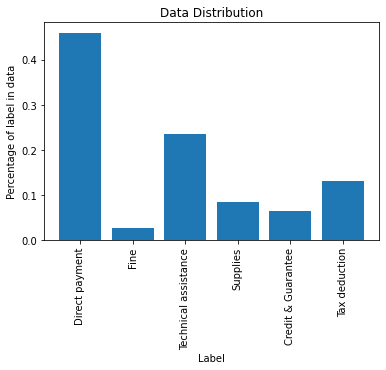

Label counts:
{'Direct payment': 0.45980707395498394, 'Fine': 0.02572347266881029, 'Technical assistance': 0.2347266881028939, 'Supplies': 0.08360128617363344, 'Credit & Guarantee': 0.06430868167202572, 'Tax deduction': 0.13183279742765272}


In [6]:
numeric_labels = labels2numeric(exp2_labels, exp2_label_names)
plot_data_distribution(numeric_labels, exp2_label_names)

In [ ]:
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1)
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, sbert_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, exp2_label_names)

In [ ]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

In [ ]:
evaluator.avg_f1

In [ ]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 3. Visualizing data (Setup from experiment 2.)

In [9]:
from tasks.data_visualization.src.plotting import *

In [11]:
sbert_model = SentenceTransformer('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1)
all_sent_embs = encode_all_sents(exp2_sents, sbert_model, proj_matrix)

100%|██████████| 311/311 [00:57<00:00,  5.37it/s]


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.004s...
[t-SNE] Computed neighbors for 311 samples in 0.070s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 10.828843
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.903408
[t-SNE] KL divergence after 1000 iterations: 0.709351
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.001s...
[t-SNE] Computed neighbors for 311 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 10.828843
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.903408
[t-SNE] KL divergence after 1000 iterations: 0.709351


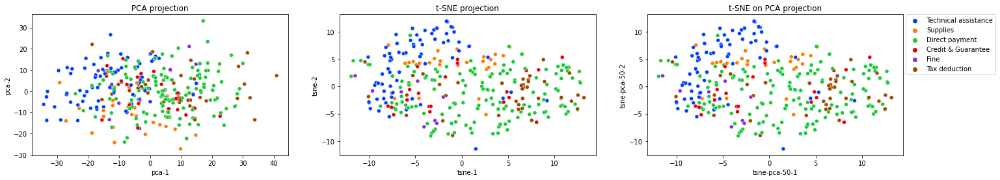

In [12]:
visualize_embeddings_2D(all_sent_embs, exp2_labels, pca_k_n_comps=50, tsne_perplexity=50)

In [19]:
visualize_PCA_embeddings_3D(all_sent_embs, exp2_labels)

### Experiment 4. Include the labels in the Z matrix process (Setup from experiment 2.)

In [26]:
# When we want to include the labels in the projection matrix, we just add them as an extra parameter
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1, include_labels=exp2_label_names)
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, sbert_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, label_names)

100%|██████████| 311/311 [00:55<00:00,  5.61it/s]


In [27]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

In [28]:
evaluator.avg_f1

array([0.25106256, 0.33028104])

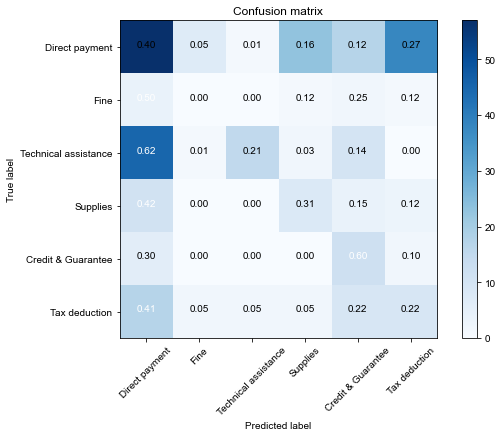

In [29]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 5.  Fine tune sentence embedding model (Setup from experiment 2.)
The FineTuning folder that contains the fine-tuned model is located on Google Drive under the folder WRI-LatinAmerica-Talent/Modeling/FineTuning. To execute the following code you should download this folder to tasks/augment_data/output/FineTuning.

In [ ]:
# Load the saved model and obtain random sentence embedding
model_save_path = "../output/FineTuning"
load_model = SentenceTransformer(model_save_path)

In [ ]:
# Simple low-dim projection
all_sent_embs = encode_all_sents(exp2_sents, load_model)
visualize_embeddings_2D(all_sent_embs, exp2_labels, tsne_perplexity=40)

In [ ]:
# Projection matrix Z low-dim projection
proj_matrix = calc_proj_matrix(exp2_sents, 50, es_nlp, load_model, 0.01)
all_sent_embs = encode_all_sents(exp2_sents, load_model, proj_matrix)
visualize_embeddings_2D(all_sent_embs, exp2_labels, tsne_perplexity=40)

In [ ]:
numeric_labels = labels2numeric(exp2_labels, exp2_label_names)
plot_data_distribution(numeric_labels, exp2_label_names)

In [ ]:
# Classify all sentences
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, load_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, exp2_label_names)

In [ ]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

In [ ]:
evaluator.avg_f1

In [ ]:
evaluator.plot_confusion_matrix(color_map='Blues')

In [ ]:
evaluator.evaluate(numeric_labels, numeric_preds)

In [ ]:
evaluator.plot_precision_recall_curve(numeric_labels, numeric_preds, bin_class=False, all_classes=True)